In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# import libraries
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

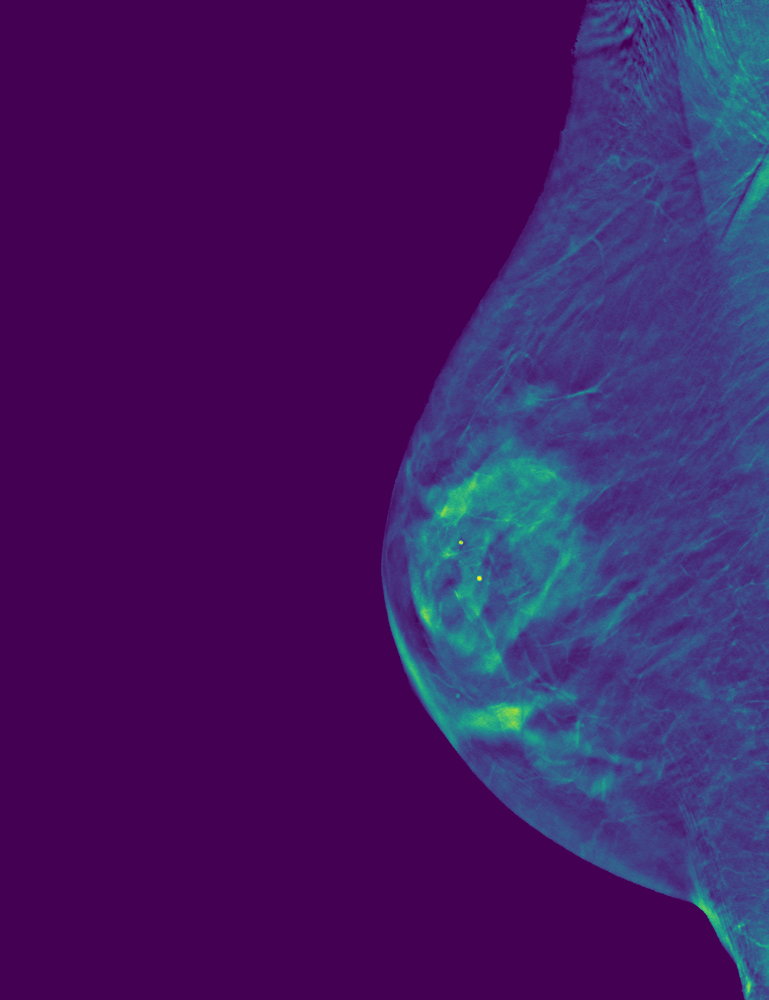

In [51]:
img1 = cv2.imread("/content/drive/MyDrive/Image Analysis/Ex_classification1/TestImages/Mammo001.png")
cv2_imshow(img1)


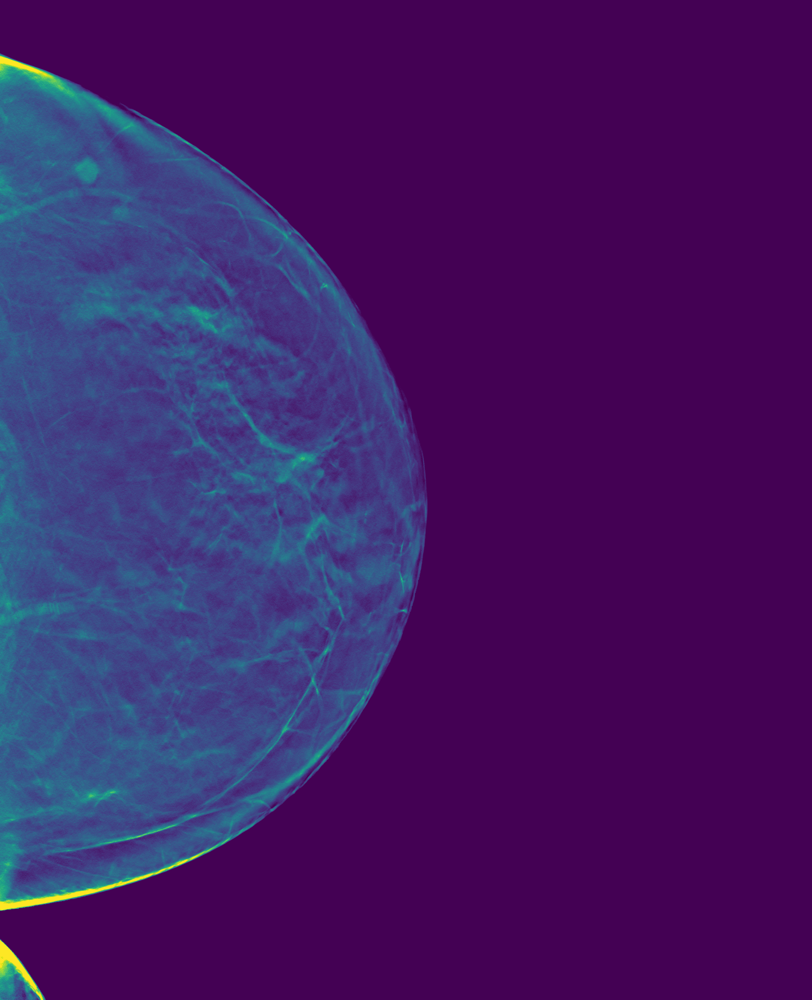

In [4]:
img2 = cv2.imread("/content/drive/MyDrive/Image Analysis/Ex_classification1/TestImages/Mammo002.png")
cv2_imshow(img2)

In [5]:
height, width, channels = img1.shape
print('(' ,height,',', width,',' ,channels,')')
print('H:', height)
print('W:', width)
print('C:', channels)

( 2457 , 1890 , 3 )
H: 2457
W: 1890
C: 3


In [6]:
height, width, channels = img2.shape
print('(' ,height,',', width,',' ,channels,')')
print('H:', height)
print('W:', width)
print('C:', channels)

( 2457 , 1996 , 3 )
H: 2457
W: 1996
C: 3


In [7]:
#define the bounding boxes
x1, y1, w1, h1 = 1116, 1724, 218, 105

In [8]:
x21, y21, w21, h21 = 267, 488, 64, 64
x22, y22, w22, h22 = 169, 384, 93, 85

In [9]:
mask1 = np.zeros_like(img1[:,:,0])
mask1[y1:y1+h1, x1:x1+w1] = 1

In [23]:
mask21 = np.zeros_like(img2[:,:,0])
mask21[y21:y21+h21, x21:x21+w21] = 1

In [24]:
mask22 = np.zeros_like(img2[:,:,0])
mask22[y22:y22+h22, x22:x22+w22] = 1

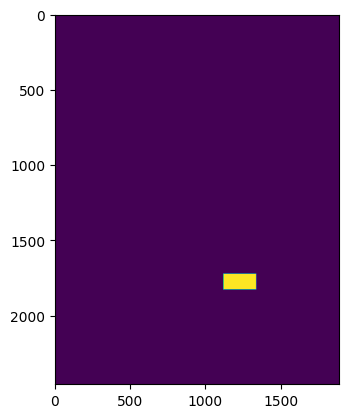

In [10]:
import matplotlib.pyplot as plt
plt.imshow(mask1)

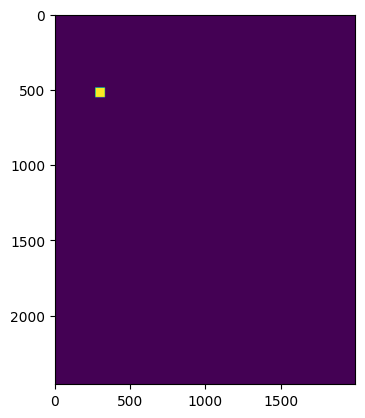

In [25]:
plt.imshow(mask21)

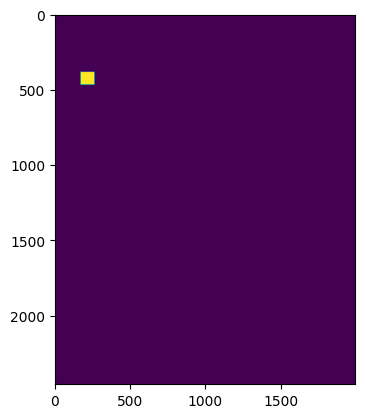

In [26]:
plt.imshow(mask22)

In [11]:
def calculateRange(i, index, tot):
  if (index < i) :
    #not enouth in the upper part
    step = i - index
    return range(-i+step, i+1)

  elif((tot-1)-index < i):
    #not enouth in the lower part
    step = i - (tot - (index + 1))
    return range(-i, i+1-step)

  else:
    #hole filter
    return range(-i, i+1)

In [12]:
def erosion(image, i):

  nrowfil = 2*i +1

  shape = image.shape
  nrows = image.shape[0]
  ncols = image.shape[1]

  output_img = image.copy()

  for r in range(nrows):
    for c in range(ncols):

      minimum = image[r][c]

      row_fil = calculateRange(i, r, nrows)
      col_fil = calculateRange(i, c, ncols)

      for row in row_fil:
        for col in col_fil:
          pixel = image[r+row][c+col]

          if(pixel < minimum):
            #update the minimum
            minimum = pixel
      output_img[r][c] = minimum

  return output_img

In [13]:
def dilation(image, i):

  nrowfil = 2*i +1

  shape = image.shape
  nrows = image.shape[0]
  ncols = image.shape[1]

  output_img = image.copy()

  for r in range(nrows):
    for c in range(ncols):

      maximum = image[r][c]

      row_fil = calculateRange(i, r, nrows)
      col_fil = calculateRange(i, c, ncols)

      for row in row_fil:
        for col in col_fil:
          pixel = image[r+row][c+col]

          if(pixel > maximum):
            #update the maximum
            maximum = pixel
      output_img[r][c] = maximum

  return output_img

In [14]:
def closing(input_img, i):
  step1 = dilation(input_img, i)
  step2 = erosion(step1, i)
  return step2

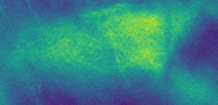

In [52]:
obj1 = np.array(img1[y1:y1+h1, x1:x1+w1])
cv2_imshow(obj1)

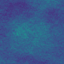

In [27]:
obj21 = np.array(img2[y21:y21+h21, x21:x21+w21])
cv2_imshow(obj21)

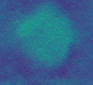

In [29]:
obj22 = np.array(img2[y22:y22+h22, x22:x22+w22])
cv2_imshow(obj22)

In [54]:
gray1 = cv2.cvtColor(obj1, cv2.COLOR_BGR2GRAY)
_, binary1 = cv2.threshold(gray1, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

In [32]:
gray21 = cv2.cvtColor(obj21, cv2.COLOR_BGR2GRAY)
_, binary21 = cv2.threshold(gray21, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

In [33]:
gray22 = cv2.cvtColor(obj22, cv2.COLOR_BGR2GRAY)
_, binary22 = cv2.threshold(gray22, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

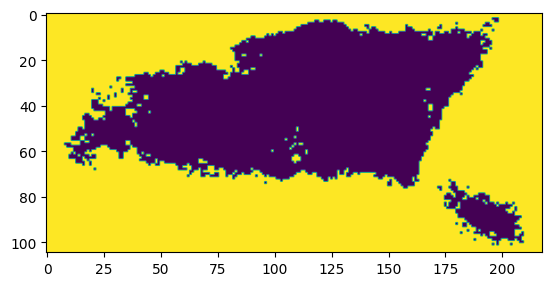

In [55]:
plt.imshow(binary1)

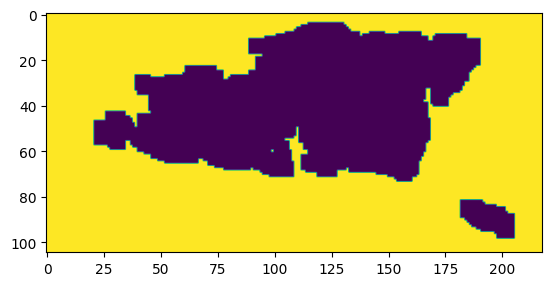

In [17]:
clo1 = closing(binary1, 3)
plt.imshow(clo1)

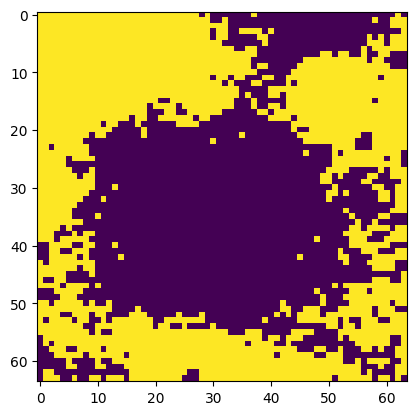

In [49]:
plt.imshow(binary21)

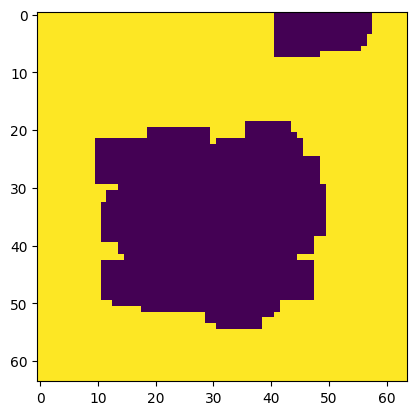

In [46]:
clo21 = closing(binary21, 3)
plt.imshow(clo21)

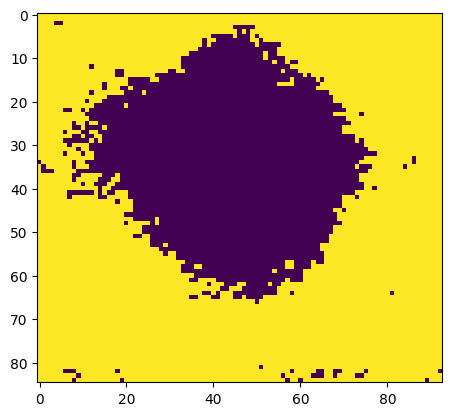

In [48]:
plt.imshow(binary22)

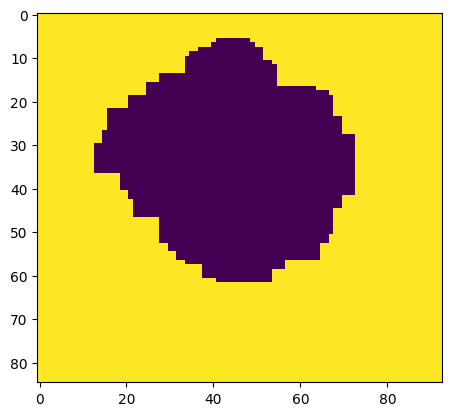

In [37]:
clo22 = closing(binary22, 3)
plt.imshow(clo22)

In [18]:
inverted1 = cv2.bitwise_not(clo1)

In [38]:
inverted21 = cv2.bitwise_not(clo21)

In [39]:
inverted22 = cv2.bitwise_not(clo22)

In [19]:
mask1 = cv2.bitwise_and(obj1, obj1, mask=inverted1)

In [40]:
mask21 = cv2.bitwise_and(obj21, obj21, mask=inverted21)

In [41]:
mask22 = cv2.bitwise_and(obj22, obj22, mask=inverted22)

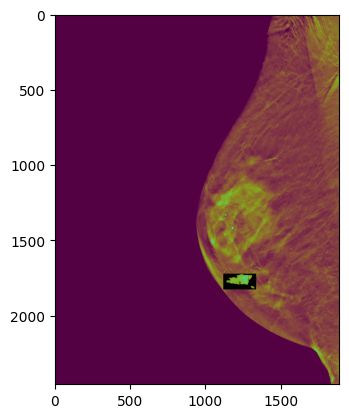

In [21]:
img1[y1:y1+h1, x1:x1+w1] = mask1
plt.imshow(img1)

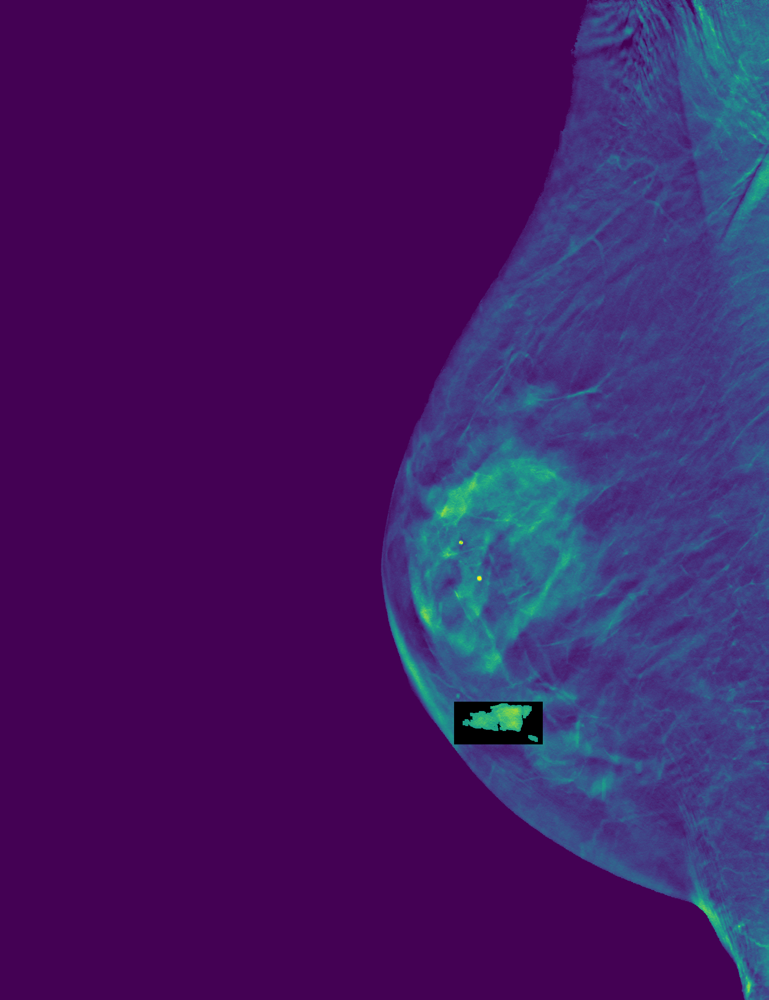

In [22]:
cv2_imshow(img1)

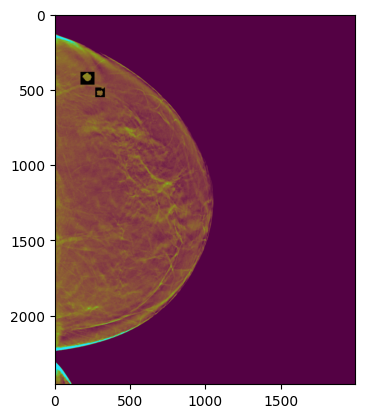

In [42]:
img2[y21:y21+h21, x21:x21+w21] = mask21
img2[y22:y22+h22, x22:x22+w22] = mask22
plt.imshow(img2)

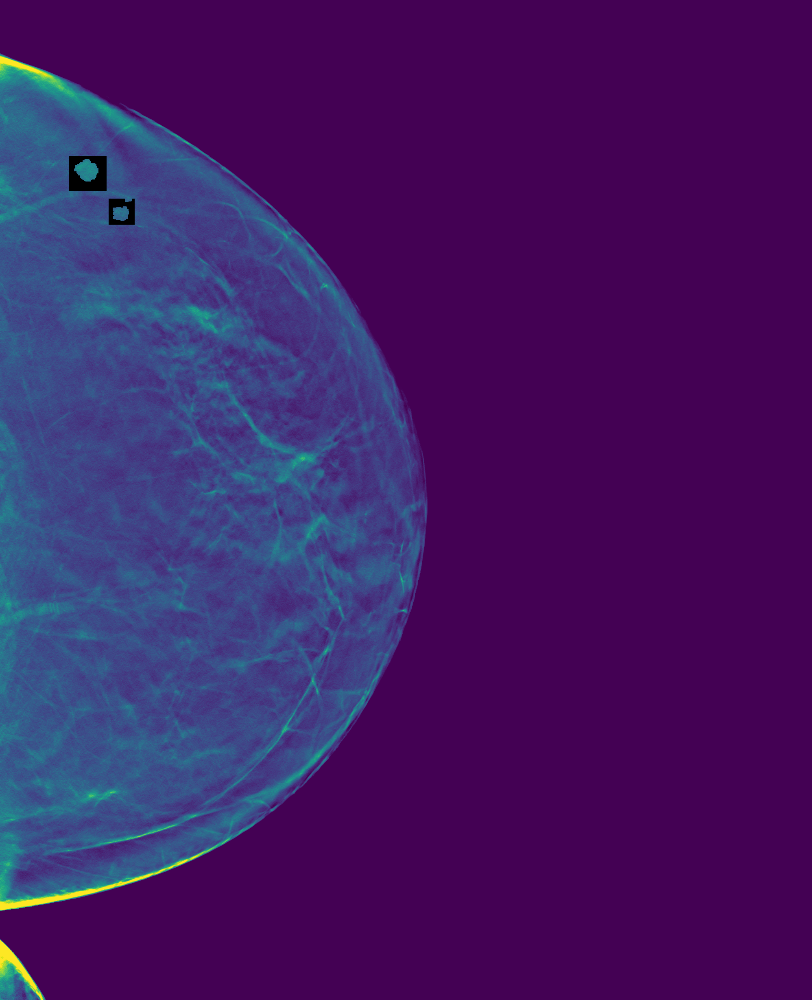

In [43]:
cv2_imshow(img2)